**CONSTANT HEIGHT STM IMAGES**.


Theory Background
-----------------

Prediction of STM images requires a knowledge of the **electronic structure** of the molecule and a theory of how STM works.

The standard theory of how STM works is based on the Tersoff-Hammann aproximation (https://journals.aps.org/prl/pdf/10.1103/PhysRevLett.50.1998), **the tunneling current is proportional to the local density of states (LDOS)** at a certain point close to the material:

$$
I(\vec{r}, V) \propto \int_0^V LDOS(\vec{r}, E_f - V + \epsilon) \,d\epsilon\
$$

The LDOS at a certain energy is simply described as the electron density, computed as $\psi(\vec{r}) \psi^*(\vec{r})$, considering only  wavefunctions at that energy:

$$
LDOS(r, E) = \sum_{i} n(E, \epsilon_i) *  \psi_i(\vec{r}) \psi_i^*(\vec{r})  
$$

Where $n(E, \epsilon)$ is the occupation function that determines the contribution of a given wavefunction. $E$ is the energy for which we want the LDOS and $\epsilon_i$ is the energy of the wavefunction. 

In summary, to compute constant height STM images, we need to:
- Get a Hamiltonian (we will use SIESTA for this).
- Compute the eigenstates (wavefunction coefficients) and eigenvalues (energies).
- Implement a function that computes the STM current $I(\vec{r}, V)$ for any point in space $\vec{r}$ at a given voltage $V$. The full equation is:

$$
I(\vec{r}, V) \propto \int_0^V \sum_{i} \left[n(-V + E, \epsilon_i) *  \psi_i(\vec{r}) \psi_i^*(\vec{r})\right] \,dE\
$$

- Take the points of space of a given plane (at constant height), as an STM tip would do.


Python implementation of STM simulation
---------------------------------------

**First perform a geometry optimization of the molecule**

You will need a sensible molecule structure (atomic coordinates) to start. Once you have your molecule structure, you will need the Hamiltonian.
If you do not have it you can just run a single calculation from the fdf of the structure telling siesta to store the Hamiltonian using `SaveHS true  `.

**To read the Hamiltonian:**

Once the SIESTA run has finished, you can do:

```python
sisl.get_sile("path/to/my/file.fdf").read_hamiltonian()
```

as we have done in previous lab sessions.

**To compute wavefunctions on the grid:**

To compute $\psi (\vec{r})$ you need three things.

1. **The eigenstate coefficients.** Once you have a hamiltonian, you can get all of them with `H.eigenstate()`. Then you can loop this object to get each individual eigenstate. Each eigenstate has its energy stored under the `.eig` property.
2. **A grid of points in space.** You can create one with `sisl.Grid(geometry, shape=(100, 100, 100))`. This will create a grid of $100x100x100$ points within the cell of your geometry.
3. **A function to project the wavefunction into the grid.** The eigenstate object has a `wavefunction` method ([docs](https://zerothi.github.io/sisl/api/generated/sisl.physics.electron.EigenstateElectron.html#sisl.physics.electron.EigenstateElectron.wavefunction)) that will project the wavefunction into an already initialized grid.

Remember that we have done this already on the first SIESTA lab, with a water molecule.

**Check the Density of States**

You can plot all the eigenstates of your system to try to understand first your system and what to expect from a STM experiment. You can do something like:

```python
H.plot.pdos(data_Erange=[-10, 10], nE=1200, Erange=[-10, 10], kgrid=[1,1,1]).split_DOS(on="species+l+m")
```

Helper: Grids have a `fill` method to set all the values of the grid to a given value, if that is needed.

**To plot the STM images at a certain height:**

A function is provided to plot molecules at multiple heights. You can use it as it is or modify it as you wish.

*Note*: If you have time, you can modify this function to create a plots at multiple voltages. Even a grid of plots at multiple voltages and multiple heights!

Let's get to work
---------------

From now on, you have to implement the STM images! 

Look at the equation for current and try to think how that can be translated into code. If you get stuck, experiment with whatever ideas you have! There's no harm in making python error, you won't break it ;)

**Some imports:**

In [48]:
import sisl
from sisl import *
import sisl.viz
import numpy as np
import matplotlib.pyplot as plt

**The helper function to plot STM images once you have the LDOS grid:**

In [3]:
# The helper function
def plot_STM_images(
    LDOS_grid: sisl.Grid, 
    min_height: int = 0, 
    max_height: int = 2,
    steps: int = 9,
    crange = None,
    colorscale: str = None
):
    """Plots constant height STM images at multiple heights

    Parameters
    ----------
    LDOS_grid:
        A grid containing the LDOS corresponding to the voltage that you
        want to plot, for ALL SPACE.
    min_height:
        The height of the first image.
    max_height:
        The height of the last image.
    steps:
        The number of steps between the first and the last image.
    log:
        Whether to plot the log of the values.
    crange:
        The range of the colorscale. E.g. [0, 2]. If None, it is computed
        from the minimum and maximum values of the data.
    colorscale:
        The plotly colorscale to use.

    Examples
    ----------

    This function should be used like:
    >>> grid = ...compute the LDOS in the grid.
    >>> plot_STM_images(grid)
    """

    # Determine all the heights that the user wants to plot
    heights = np.linspace(min_height, max_height, steps)
    # Get the position of the benzene molecule
    z_0 = grid.geometry.xyz[:, 2].max()
    
    # Initialize a list of plots
    plots = []
    coloraxes = []
    # Loop through the heights, and for each of them we will create a plot.
    for height in heights:
        # Get the z for which we want the LDOS (benzene position + height)
        z = z_0 + height
        
        # Get the plot for this height
        plot = LDOS_grid.plot(axes="xy", z_range=[z - 0.1, z + 0.1], crange=crange, colorscale=colorscale)

        # And append it to the list
        plots.append(plot)

    # Merge all the plots, with some extra arguments to beautify the plot.
    return sisl.viz.merge_plots(
        *plots, 
        composite_method="subplots", 
        arrange="square", 
        subplot_titles=[f"Height = {height} Ang" for height in heights],
        horizontal_spacing=0,
        vertical_spacing=0.05
    ).update_xaxes(
        visible=False
    ).update_yaxes(
        visible=False
    ).update_layout(
        height=900, title=f"Constant height STM images",
    )

## Load Hamiltonian and geometry from fdf

In [17]:
fdf = get_sile("../run/stm.fdf")

In [18]:
H = fdf.read_hamiltonian()

In [21]:
print(H)

Hamiltonian{non-zero: 11646, orthogonal: False,
 Spin{unpolarized},
 Geometry{na: 12, no: 108,
  Atoms{species: 2,
   Atom{C, Z: 6, mass(au): 12.01100, maxR: 4.00313,
    AtomicOrbital{2sZ1, q0: 2.0, SphericalOrbital{l: 0, R: 3.10400910650152, q0: 2.0}},
    AtomicOrbital{2sZ2, q0: 0.0, SphericalOrbital{l: 0, R: 1.7478297099283084, q0: 0.0}},
    AtomicOrbital{2pyZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 4.0031312515807995, q0: 2.0}},
    AtomicOrbital{2pzZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 4.0031312515807995, q0: 2.0}},
    AtomicOrbital{2pxZ1, q0: 0.6666666666666666, SphericalOrbital{l: 1, R: 4.0031312515807995, q0: 2.0}},
    AtomicOrbital{2pyZ2, q0: 0.0, SphericalOrbital{l: 1, R: 2.2502673795591357, q0: 0.0}},
    AtomicOrbital{2pzZ2, q0: 0.0, SphericalOrbital{l: 1, R: 2.2502673795591357, q0: 0.0}},
    AtomicOrbital{2pxZ2, q0: 0.0, SphericalOrbital{l: 1, R: 2.2502673795591357, q0: 0.0}},
    AtomicOrbital{3dxyZ1P, q0: 0.0, SphericalOrbital{l: 2, R: 4.

In [22]:
molec = H.geometry

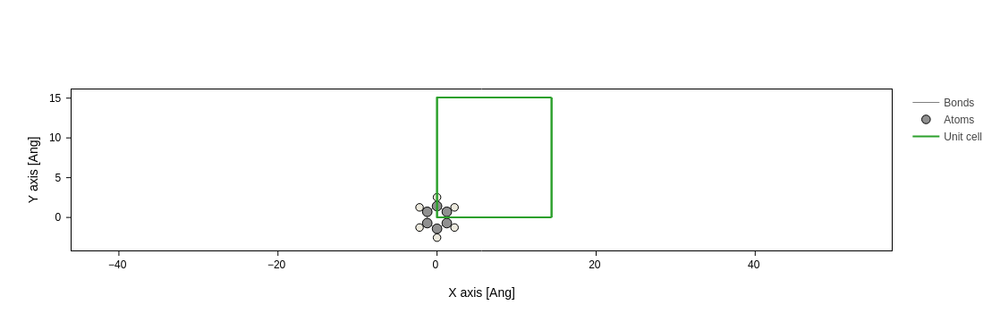

In [23]:
molec.plot(axes="xy")

## Eigenstates

In [32]:
es=H.eigenstate()

In [33]:
print(len(es))

108


In [34]:
es.eig

array([-16.35141077, -13.7030358 , -13.70179224, -10.1241072 ,
       -10.12051001,  -8.02506969,  -6.57477496,  -6.18062997,
        -5.5179148 ,  -5.51217641,  -4.23294558,  -3.64939828,
        -3.64634259,  -1.65411587,  -1.65208944,   3.26595821,
         3.26879882,   5.13709341,   6.1492699 ,   6.1506238 ,
         6.90342037,   6.90825296,   6.98454389,   7.70299574,
         8.75228667,   9.72907347,   9.77606968,  10.1429176 ,
        10.14471369,  10.580656  ,  10.5889613 ,  10.93557433,
        10.93640361,  12.47366344,  12.47765125,  12.49776273,
        13.27335283,  13.27751741,  13.45593425,  13.55749849,
        13.56009438,  14.66229008,  15.8146017 ,  16.80893448,
        16.81052833,  17.62494679,  17.65440528,  17.65746935,
        18.59953029,  18.96319315,  18.97268203,  20.69454597,
        21.04288116,  22.43929237,  22.43979235,  23.04664834,
        23.05263882,  23.31673623,  23.32084932,  25.59313448,
        25.61662354,  26.66701259,  27.17701531,  27.80

In [35]:
idx_lumo = (es.eig > 0).nonzero()[0][0]

In [36]:
print(idx_lumo)

15


In [42]:
print("HOMO E=",es.eig[14]," eV")
print("LUMO E=",es.eig[15]," eV")

HOMO E= -1.6520894394077752  eV
LUMO E= 3.2659582115538464  eV


## Density of States
We can use the .dos method to obtain the density of states

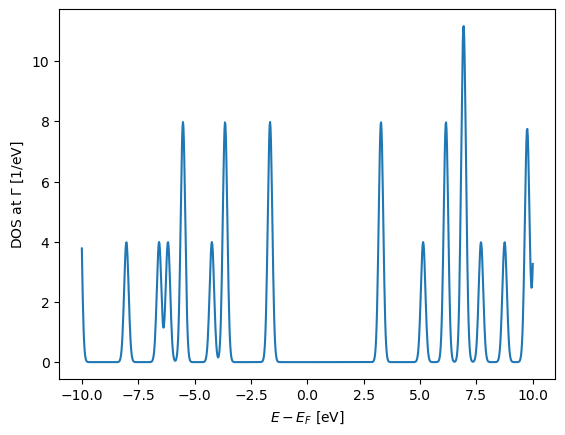

In [60]:
E = np.linspace(-10, 10, 1000)
plt.plot(E, es.DOS(E))
plt.xlabel(r"$E - E_F$ [eV]")
plt.ylabel(r"DOS at $\Gamma$ [1/eV]");

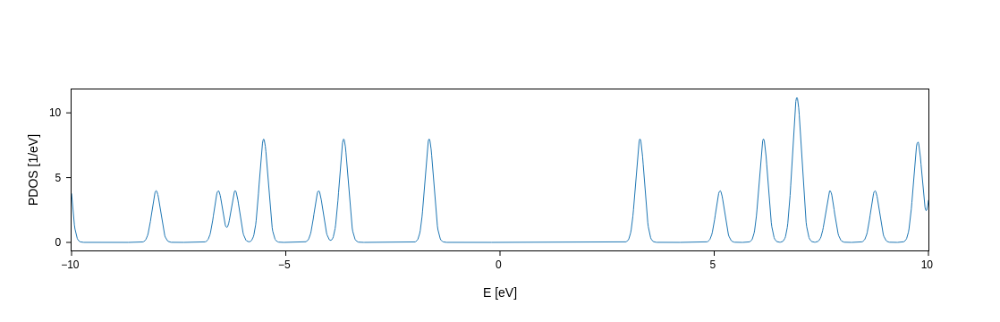

In [46]:
H.plot.pdos(data_Erange=[-10,10],Erange=[-10,10])

In [ ]:
E = np.linspace(-4, 4, 400)
plt.plot(E, es.DOS(E))
plt.xlabel(r"$E - E_F$ [eV]")
plt.ylabel(r"DOS at $\Gamma$ [1/eV]");

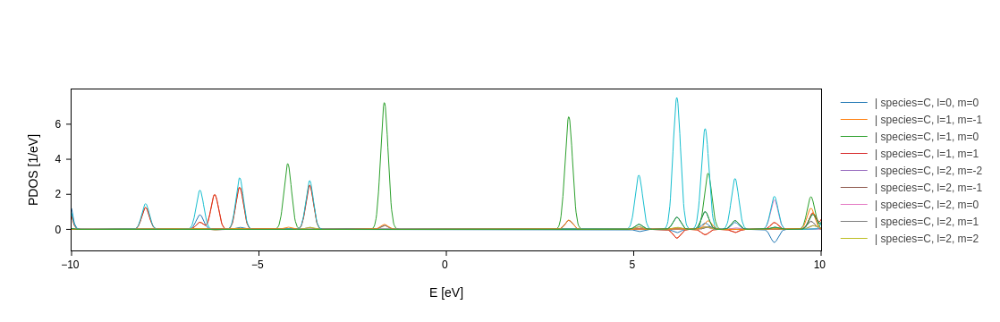

In [43]:
H.plot.pdos(data_Erange=[-10,10],nE=1200,Erange=[-10,10],kgrid=[1,1,1]).split_DOS(on="species+l+m")

In [53]:
molec.lattice.origin =[-32.5,-32.5,-32.5]

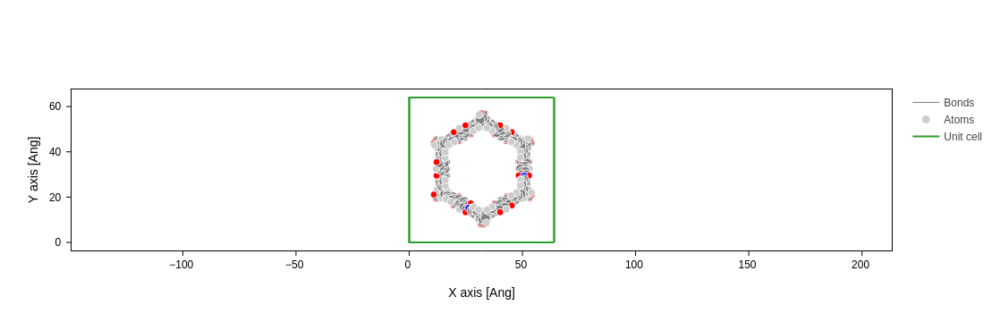

In [54]:
molec.plot(axes="xy")

Eigenstates

In [7]:
es = H.eigenstate()
print(len(es))

2334


In [8]:
idx_lumo = (es.eig > 0).nonzero()[0][0]

In [9]:
print(idx_lumo)

528


In [10]:
print("HOMO E=",es.eig[527]," eV")
print("LUMO E=",es.eig[528]," eV")

HOMO E= -0.8940838849458899  eV
LUMO E= 1.210829816942875  eV


-----------------------------------------------------------------------------------
**Plotting Local Density of States**

Create a grid and fill the grid with LDOS

In [15]:
G=sisl.Grid((100,100,100), geometry = molec)
G_t=sisl.Grid((100,100,100), geometry=molec)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

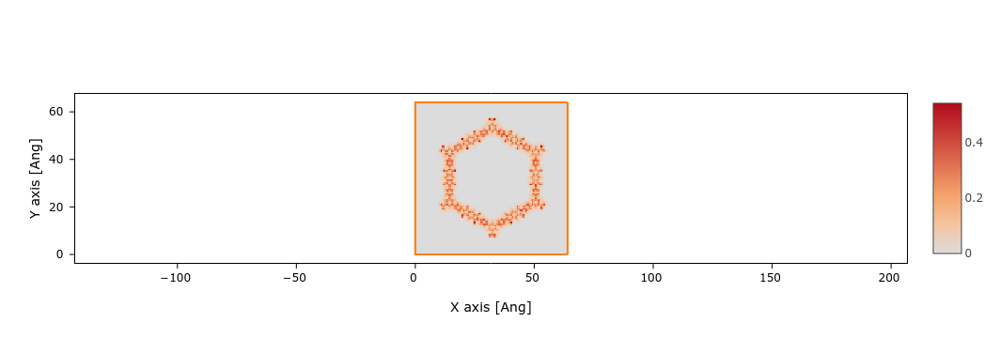

In [23]:
for n in range(0,len(es)):
    G_t.fill(0)
    es[n].wavefunction(G_t)
    G_n = G_t*G_t
    G=G+G_n
print("Plotting...")
G.plot(axes="xy")
    

# PDOS #
Veure estats que tenim per a diferents energies per a poder interpretar imatges

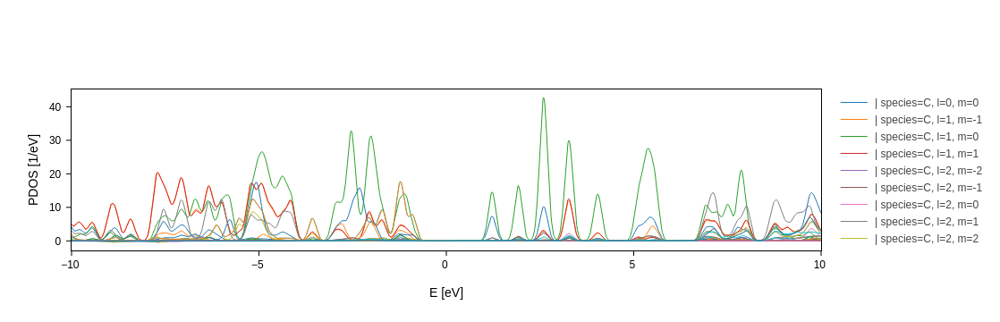

In [11]:
H.plot.pdos(data_Erange=[-10,10],nE=1200,Erange=[-10,10],kgrid=[1,1,1]).split_DOS(on="species+l+m")
    

# STM images #
Now we plot the STM images taking into acount the states available for a given energy

In [17]:
def STM_grid(H, V):
    gridT = sisl.Grid((100, 100, 100), geometry=molec)
    grid = sisl.Grid((100, 100, 100), geometry=molec)
    gridT.fill(0)
    E=-V
    for i in range(0,len(es)):
        if 0<es[i].eig<E:    
            grid.fill(0)
            es[i].wavefunction(grid)
            GT=grid*grid.grid.conj()
            gridT=gridT+GT 
        if E<es[i].eig<0:    
            grid.fill(0)
            es[i].wavefunction(grid)
            GT=grid*grid.grid.conj()
            gridT=gridT+GT 
    result=gridT
    return result

In [18]:
# The helper function
def plot_STM_images(
    LDOS_grid: sisl.Grid, 
    min_height: int = 0, 
    max_height: int = 2,
    steps: int = 9,
    crange = None,
    colorscale: str = None
):
    # Determine all the heights that the user wants to plot
    heights = np.linspace(min_height, max_height, steps)
    # Get the position of the benzene molecule
    z_0 = grid.geometry.xyz[:, 2].max()
    
    # Initialize a list of plots
    plots = []
    coloraxes = []
    # Loop through the heights, and for each of them we will create a plot.
    for height in heights:
        # Get the z for which we want the LDOS (benzene position + height)
        z = z_0 + height
        
        # Get the plot for this height
        plot = LDOS_grid.plot(axes="xy", z_range=[z - 0.1, z + 0.1], crange=crange, colorscale=colorscale)

        # And append it to the list
        plots.append(plot)

    # Merge all the plots, with some extra arguments to beautify the plot.
    return sisl.viz.merge_plots(
        *plots, 
        composite_method="subplots", 
        arrange="square", 
        subplot_titles=[f"Height = {height} Ang" for height in heights],
        horizontal_spacing=0,
        vertical_spacing=0.05
    ).update_xaxes(
        visible=False
    ).update_yaxes(
        visible=False
    ).update_layout(
        height=900, title=f"Constant height STM images",
    )

In [19]:
V=STM_grid(H, 5)
plot_STM_images(V)

AttributeError: module 'sisl.grid' has no attribute 'geometry'

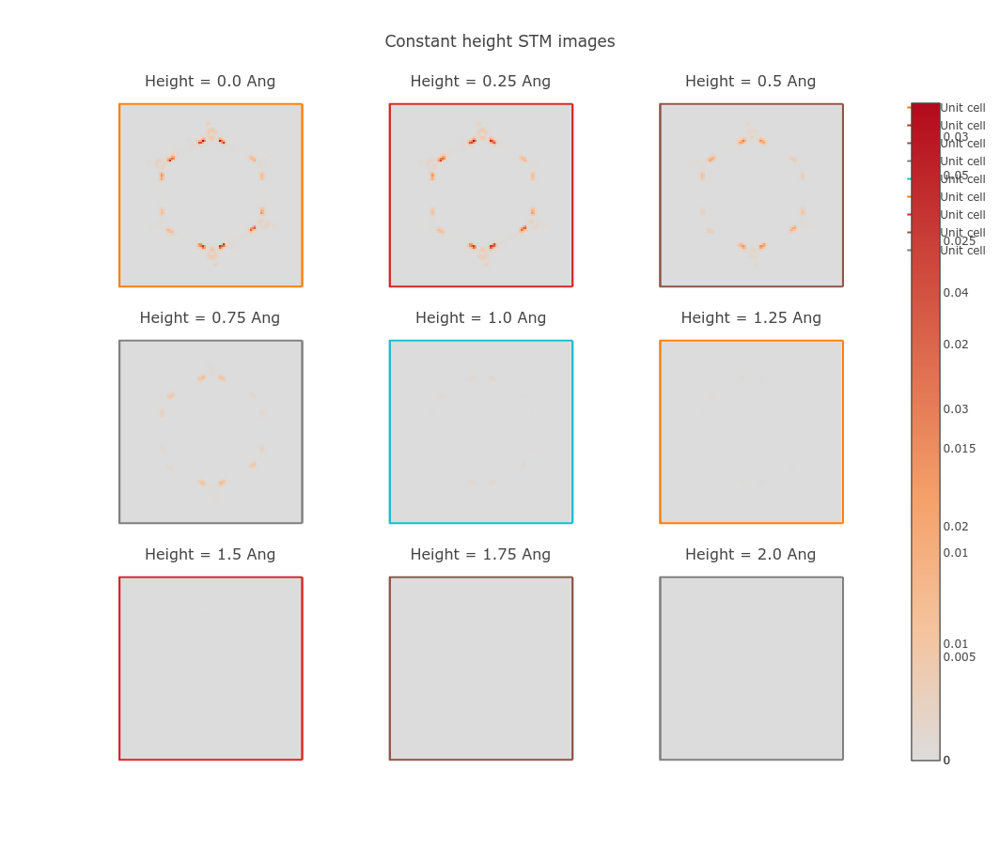

In [39]:
V=STM_grid(H, 2)
plot_STM_images(V)

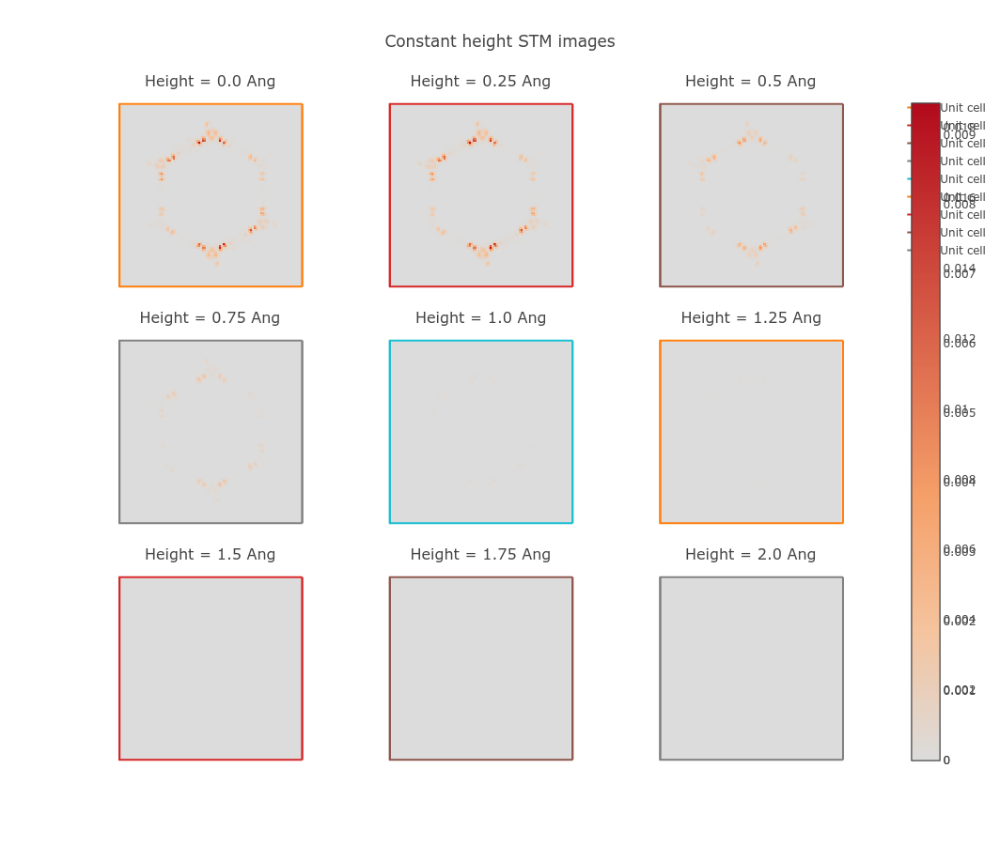

In [40]:
V=STM_grid(H, 1.5)
plot_STM_images(V)

In [26]:
def STM_grid(H, V):
    gridT = sisl.Grid((300, 300, 100), geometry=molec)
    grid = sisl.Grid((300, 300, 100), geometry=molec)
    gridT.fill(0)
    E=-V
    for i in range(0,len(es)):
        if 0<es[i].eig<E:    
            grid.fill(0)
            es[i].wavefunction(grid)
            GT=grid*grid.grid.conj()
            gridT=gridT+GT 
        if E<es[i].eig<0:    
            grid.fill(0)
            es[i].wavefunction(grid)
            GT=grid*grid.grid.conj()
            gridT=gridT+GT 
    result=gridT
    return result

In [29]:
# The helper function
def plot_STM_images(
    LDOS_grid: sisl.Grid, 
    min_height: int = 0, 
    max_height: int = 2.0,
    steps: int = 9,
    crange = None,
    colorscale: str = None
):
    # Determine all the heights that the user wants to plot
    heights = np.linspace(min_height, max_height, steps)
    # Get the position of the molecule
    z_0 = G.geometry.xyz[:, 2].max()
    
    # Initialize a list of plots
    plots = []
    coloraxes = []
    # Loop through the heights, and for each of them we will create a plot.
    for height in heights:
        # Get the z for which we want the LDOS (benzene position + height)
        z = z_0 + height
        
        # Get the plot for this height
        plot = LDOS_grid.plot(axes="xy", z_range=[z - 0.1, z + 0.1], crange=crange, colorscale=colorscale)

        # And append it to the list
        plots.append(plot)

    # Merge all the plots, with some extra arguments to beautify the plot.
    return sisl.viz.merge_plots(
        *plots, 
        composite_method="subplots", 
        arrange="square", 
        subplot_titles=[f"Height = {height} Ang" for height in heights],
        horizontal_spacing=0,
        vertical_spacing=0.05
    ).update_xaxes(
        visible=False
    ).update_yaxes(
        visible=False
    ).update_layout(
        height=900, title=f"Constant height STM images",
    )

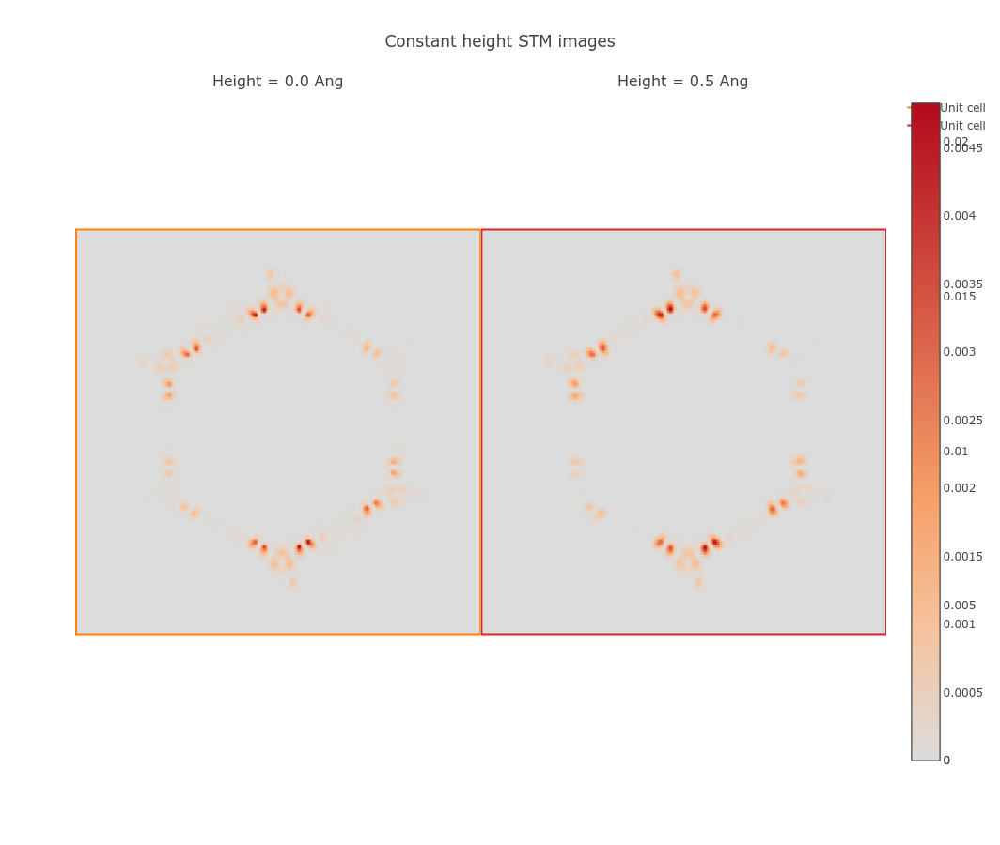

In [28]:
V=STM_grid(H, 1.5)
plot_STM_images(V)

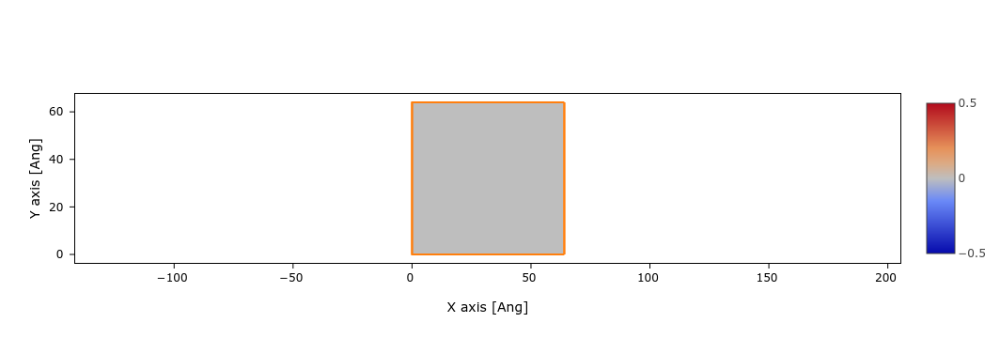

In [12]:
molec.lattice.origin =[0,0,0]
imatge=sisl.Grid((100,100,100),geometry=molec)
imatge.plot(axes="xy")

Add wavefunction

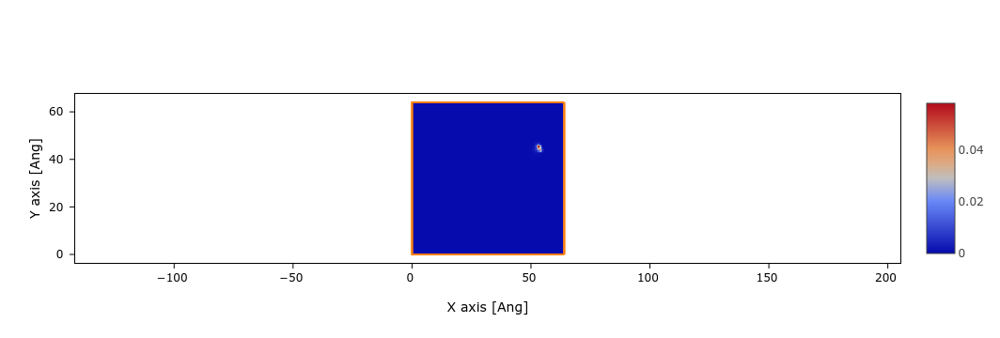

In [13]:
imatge.fill(0)
es[0].wavefunction(imatge)
imatge.plot(axes="xy")

In [ ]:
def LDOS_grid(H, V):
    """Computes the LDOS in a grid.

    Parameters
    ----------
    H:
        the Hamiltonian of the system
    V:
        the voltage for which you want the LDOS.
    """

    grid = #...compute grid

    return grid

This function contains the basic arguments, of course you could add more inputs to allow the user to further tweak the functionality.

**Your place to work:**